In [15]:
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt 
import seaborn as sns
from scipy import  stats
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.ensemble import RandomForestRegressor
import plotly.express as px 
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from pydantic_settings import BaseSettings



In [6]:
df = pd.read_csv('C:\\Users\\Hp\\Desktop\\dataset\\5G_energy_consumption_dataset.csv')
df.head()

,Time,BS,Energy,load,ESMODE,TXpower
0,20230101 010000,B_0,64.275037,0.487936,0.0,7.101719
1,20230101 020000,B_0,55.904335,0.344468,0.0,7.101719
2,20230101 030000,B_0,57.698057,0.193766,0.0,7.101719
3,20230101 040000,B_0,55.156951,0.222383,0.0,7.101719
4,20230101 050000,B_0,56.053812,0.175436,0.0,7.101719


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92629 entries, 0 to 92628
Data columns (total 6 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Time     92629 non-null  object 
 1   BS       92629 non-null  object 
 2   Energy   92629 non-null  float64
 3   load     92629 non-null  float64
 4   ESMODE   92629 non-null  float64
 5   TXpower  92629 non-null  float64
dtypes: float64(4), object(2)
memory usage: 4.2+ MB


In [8]:
df1 = df['BS']
df1 = [int(item.split('_')[1]) for item in df['BS']]

In [18]:
df['BS'].unique()

array([   0,    1,    2,    3,    4,    5,    6,    7,    8,    9,   10,
         11,   12,   14,   15,   16,   17,   18,   19,   20,   21,   22,
         23,   24,   25,   26,   27,   28,   29,   30,   31,   32,   33,
         34,   35,   36,   37,   38,   39,   40,   41,   42,   43,   44,
         45,   46,   47,   48,   49,   50,   51,   52,   53,   54,   55,
         56,   57,   58,   59,   60,   61,   62,   63,   64,   65,   66,
         67,   68,   69,   70,   71,   72,   73,   74,   75,   76,   77,
         78,   79,   80,   81,   82,   83,   84,   85,   86,   87,   88,
         89,   90,   91,   92,   93,   94,   95,   96,   97,   98,   99,
        100,  101,  102,  103,  104,  105,  106,  107,  108,  109,  110,
        111,  112,  113,  114,  115,  116,  117,  118,  119,  120,  121,
        122,  123,  124,  125,  126,  127,  128,  129,  130,  131,  132,
        133,  134,  135,  136,  137,  138,  139,  140,  141,  142,  143,
        144,  145,  146,  147,  148,  149,  150,  1

In [9]:
df['BS'] = df1
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92629 entries, 0 to 92628
Data columns (total 6 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Time     92629 non-null  object 
 1   BS       92629 non-null  int64  
 2   Energy   92629 non-null  float64
 3   load     92629 non-null  float64
 4   ESMODE   92629 non-null  float64
 5   TXpower  92629 non-null  float64
dtypes: float64(4), int64(1), object(1)
memory usage: 4.2+ MB


In [10]:
df.isna().sum()

Time       0
BS         0
Energy     0
load       0
ESMODE     0
TXpower    0
dtype: int64

In [11]:
df.duplicated().sum()

np.int64(0)

In [12]:
corr1 = df.corr(numeric_only=True)

<Axes: >

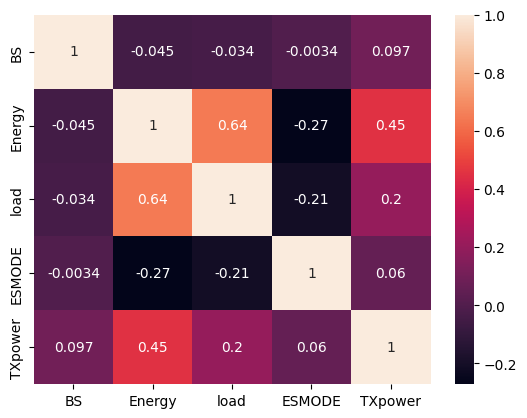

In [13]:
sns.heatmap(corr1, annot=True)

In [ ]:
profiling_pandas = ProfileReport(df, explorative=True, title='5g Pandas Profiling report')
profiling_pandas.to_file('5g_pandas_profiling_report.html')
profiling_pandas.to_notebook_iframe()

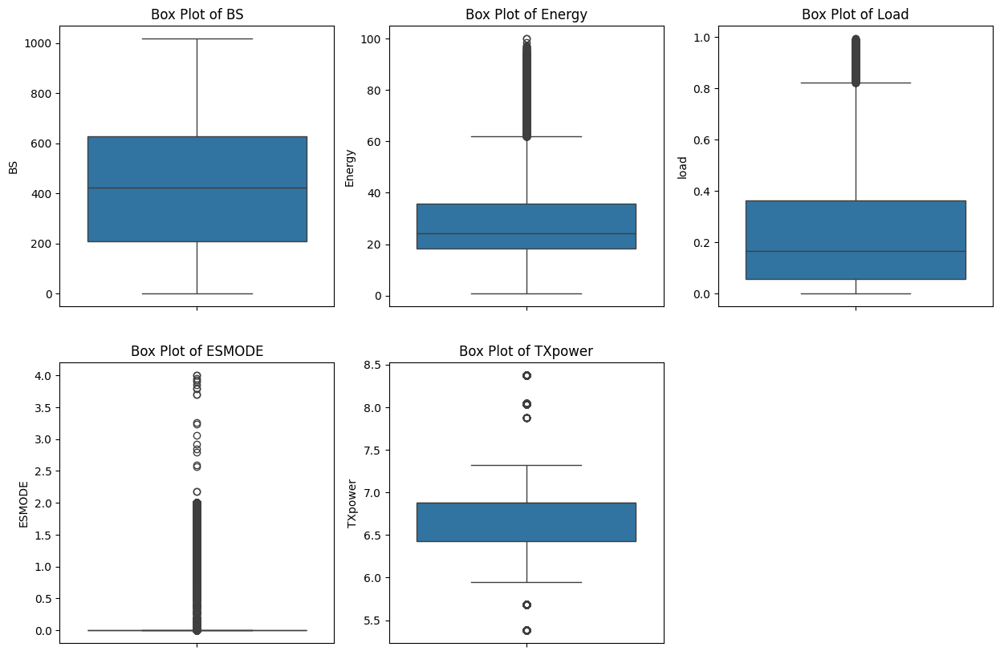

In [19]:
# Outliers :

plt.figure(figsize=(15, 10))
# Box plot for 'BS'
plt.subplot(2, 3, 1)
sns.boxplot(y=df['BS'])
plt.title('Box Plot of BS')
# Box plot for 'TXpower'
plt.subplot(2, 3, 2)
sns.boxplot(y=df['Energy'])
plt.title('Box Plot of Energy')

plt.subplot(2, 3, 3)
sns.boxplot(y=df['load'])
plt.title('Box Plot of Load')

plt.subplot(2, 3, 4)
sns.boxplot(y=df['ESMODE'])
plt.title('Box Plot of ESMODE')

plt.subplot(2, 3, 5)
sns.boxplot(y=df['TXpower'])
plt.title('Box Plot of TXpower')

plt.show()


In [20]:
# Identify Outliers with Z-score
# Time	BS	Energy	load	ESMODE	TXpower
df10 = df.copy()
df10 = df10.drop(columns=['Time', 'BS'])
df10 = df10[(np.abs(stats.zscore(df10)) < 3).all(axis=1)]
df10.info()


<class 'pandas.core.frame.DataFrame'>
Index: 86260 entries, 0 to 92628
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Energy   86260 non-null  float64
 1   load     86260 non-null  float64
 2   ESMODE   86260 non-null  float64
 3   TXpower  86260 non-null  float64
dtypes: float64(4)
memory usage: 3.3 MB


Text(0.5, 1.0, 'Box Plot of TXpower')

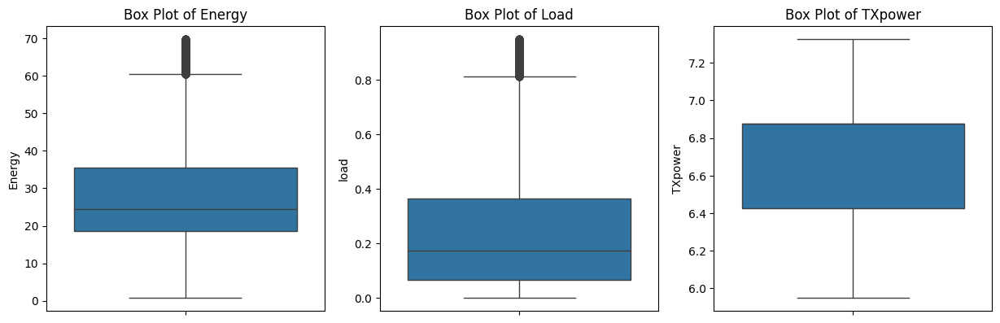

In [21]:
plt.figure(figsize=(15, 10))
# Box plot for 'BS'
plt.subplot(2, 3, 1)
sns.boxplot(y=df10['Energy'])
plt.title('Box Plot of Energy')
# Box plot for 'TXpower'
plt.subplot(2, 3, 2)
sns.boxplot(y=df10['load'])
plt.title('Box Plot of Load')

plt.subplot(2, 3, 3)
sns.boxplot(y=df10['TXpower'])
plt.title('Box Plot of TXpower')


In [22]:
df10.shape

(86260, 4)

In [24]:
df = df.drop(columns=['Energy',	'load',	'ESMODE',	'TXpower'])

In [25]:
df10

,Energy,load,ESMODE,TXpower
0,64.275037,0.487936,0.0,7.101719
1,55.904335,0.344468,0.0,7.101719
2,57.698057,0.193766,0.0,7.101719
3,55.156951,0.222383,0.0,7.101719
4,56.053812,0.175436,0.0,7.101719
...,...,...,...,...
92624,14.648729,0.087538,0.0,7.325859
92625,14.648729,0.082635,0.0,7.325859
92626,13.452915,0.055538,0.0,7.325859
92627,13.602392,0.058077,0.0,7.325859


In [26]:
df_new = pd.concat([df, df10], axis=1, join='inner')
df_new.head()


,Time,BS,Energy,load,ESMODE,TXpower
0,20230101 010000,0,64.275037,0.487936,0.0,7.101719
1,20230101 020000,0,55.904335,0.344468,0.0,7.101719
2,20230101 030000,0,57.698057,0.193766,0.0,7.101719
3,20230101 040000,0,55.156951,0.222383,0.0,7.101719
4,20230101 050000,0,56.053812,0.175436,0.0,7.101719


In [27]:
df_new.shape

(86260, 6)

In [30]:
df_new['Time'] = pd.to_datetime(df_new['Time'])
df_new.info()

<class 'pandas.core.frame.DataFrame'>
Index: 86260 entries, 0 to 92628
Data columns (total 6 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   Time     86260 non-null  datetime64[ns]
 1   BS       86260 non-null  int64         
 2   Energy   86260 non-null  float64       
 3   load     86260 non-null  float64       
 4   ESMODE   86260 non-null  float64       
 5   TXpower  86260 non-null  float64       
dtypes: datetime64[ns](1), float64(4), int64(1)
memory usage: 4.6 MB


In [31]:
df_new['year'] = df_new['Time'].dt.year
df_new['month'] = df_new['Time'].dt.month
df_new['hour'] = df_new['Time'].dt.hour

df_new.info()

<class 'pandas.core.frame.DataFrame'>
Index: 86260 entries, 0 to 92628
Data columns (total 9 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   Time     86260 non-null  datetime64[ns]
 1   BS       86260 non-null  int64         
 2   Energy   86260 non-null  float64       
 3   load     86260 non-null  float64       
 4   ESMODE   86260 non-null  float64       
 5   TXpower  86260 non-null  float64       
 6   year     86260 non-null  int32         
 7   month    86260 non-null  int32         
 8   hour     86260 non-null  int32         
dtypes: datetime64[ns](1), float64(4), int32(3), int64(1)
memory usage: 5.6 MB


In [32]:
df_new = df_new.drop(columns=['Time'])

In [33]:
df_new

,BS,Energy,load,ESMODE,TXpower,year,month,hour
0,0,64.275037,0.487936,0.0,7.101719,2023,1,1
1,0,55.904335,0.344468,0.0,7.101719,2023,1,2
2,0,57.698057,0.193766,0.0,7.101719,2023,1,3
3,0,55.156951,0.222383,0.0,7.101719,2023,1,4
4,0,56.053812,0.175436,0.0,7.101719,2023,1,5
...,...,...,...,...,...,...,...,...
92624,1018,14.648729,0.087538,0.0,7.325859,2023,1,17
92625,1018,14.648729,0.082635,0.0,7.325859,2023,1,18
92626,1018,13.452915,0.055538,0.0,7.325859,2023,1,21
92627,1018,13.602392,0.058077,0.0,7.325859,2023,1,22


In [62]:
fig2 = px.histogram(df_new['TXpower'], x= 'TXpower', title='TX power')
fig3 = px.histogram(df_new['Energy'], x= 'Energy', title='Energy')
fig4 = px.histogram(df_new['load'], x= 'load', title='load')
fig5 = px.histogram(df_new['ESMODE'], x= 'ESMODE', title='ESMODE')
fig6 = px.histogram(df_new['BS'], x= 'BS', title='BS')
fig7 = px.histogram(df_new['month'], x= 'month', title='Month')
fig8 = px.histogram(df_new['year'], x= 'year', title='year')

fig = make_subplots(rows=5, cols=3, subplot_titles=('TX power', 
                                                    '', 
                                                    'Energy',
                                                     '',
                                                     'load',
                                                      '',
                                                      'ESMODE',
                                                      '',
                                                       'BS',
                                                       '',
                                                        'Month',
                                                        '',
                                                          'Year')) 
# Add traces 
fig.add_trace(fig2['data'][0], row=1, col=1) 
fig.add_trace(fig3['data'][0], row=1, col=3) 
fig.add_trace(fig4['data'][0], row=2, col=2) 
fig.add_trace(fig5['data'][0], row=3, col=1)
fig.add_trace(fig6['data'][0], row=3, col=3)
fig.add_trace(fig7['data'][0], row=4, col=2)
fig.add_trace(fig8['data'][0], row=5, col=1)


fig.update_layout(title_text='Histograms for Multiple Columns')
fig.show()

Select your target variable and the features
Split your dataset to training and test sets
Based on your data exploration phase select a ML regression algorithm and train it on the training set
Assess your model performance on the test set using relevant evaluation metrics
Discuss with your cohort alternative ways to improve your model performance

Training Data

In [36]:
X=df_new.drop(columns=['Energy'])
y = df_new['Energy']

X_train, X_test, y_train, y_test = train_test_split (X,y, test_size=0.2, random_state=42)
X_test.shape, X_train.shape, y_test.shape, y_train.shape

((17252, 7), (69008, 7), (17252,), (69008,))

Linear Regression

In [37]:
linear_mod = LinearRegression()
linear_mod.fit(X_train, y_train)
prediction = linear_mod.predict(X_test)
mse = mean_squared_error(y_true=y_test, y_pred=prediction)
r2 = r2_score(y_true=y_test, y_pred=prediction)
print('Mse', mse)
print('R2', r2)

Mse 78.42132455535642
R2 0.5121407394207161


polynomial

In [38]:
poly_features = PolynomialFeatures(degree=5)
X_train_poly = poly_features.fit_transform(X_train)
X_test_poly = poly_features.fit_transform(X_test)

In [39]:
linear_mod_poly = LinearRegression()
linear_mod_poly.fit(X_train_poly, y_train)
prediction_poly = linear_mod_poly.predict(X_test_poly)
mse_poly = mean_squared_error(y_true=y_test, y_pred=prediction_poly)
r2_poly = r2_score(y_true=y_test, y_pred=prediction_poly)
print('Mse', mse_poly)
print('R2', r2_poly)

Mse 51.62513594655451
R2 0.678839897272931


Random forest

In [40]:
rand_forest = RandomForestRegressor(n_estimators=30)

rand_forest.fit(X_train, y_train)
prediction_forest = rand_forest.predict(X_test)
mse_foret = mean_squared_error(y_true=y_test, y_pred=prediction_forest)
r2_forest = r2_score(y_true=y_test, y_pred=prediction_forest)
print('Mse', mse_foret)
print('R2', r2_forest)


Mse 6.993649564131328
R2 0.9564924881790371


In [41]:
rand = RandomForestRegressor()
paramaters = {'n_estimators' : [10,20,30,40],
              'max_depth' : [5,7,10]
             }
grid_search = GridSearchCV(estimator=rand, param_grid=paramaters, scoring='r2', cv = 10)
best_model = grid_search.fit(X_train, y_train)

In [42]:
predict = best_model.predict(X_test)
print(grid_search.best_params_)
print(predict)